Bu proje mehmetalimizrak.com.tr isimli web sitemde yayımlanan Doağl Dil İşleme (NLP) yazımın serisi için oluşturulmuştur.

Bu projede Kaggle'da yayımlanan https://www.kaggle.com/datasets/clmentbisaillon/fake-and-real-news-dataset/data dataset verileri kullanılmıştır. Bu not defterinde, sahte haberleri tespit etmek ve sınıflandırmak için Doğal Dil İşleme'nin (NLP) nasıl kullanılabileceğini inceleyeceğiz. Sahte haberleri tespit edip sınıflandırmak ve bunların etkinliğini analiz etmek için kullanılabilecek farklı teknik ve yaklaşımlara bakacağız.

In [35]:
# Imports for Dataset
import time
import numpy as np
import pandas as pd
import nltk
from nltk import word_tokenize
import string
nltk.download('stopwords')
import tensorflow as tf


import datetime as dt

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns


# Preprocessing
from wordcloud import WordCloud
from sklearn.model_selection import train_test_split
from nltk.corpus import stopwords 
from tensorflow.keras.preprocessing.text import Tokenizer 
from tensorflow.keras.preprocessing.sequence import pad_sequences



# Training Model
from tensorflow.keras.layers import SimpleRNN, Embedding, Dense
from tensorflow.keras.models import Sequential
from sklearn.metrics import log_loss, roc_auc_score, confusion_matrix
from sklearn.metrics import roc_curve, auc



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
df_fake = pd.read_csv("Fake.csv")
df_true = pd.read_csv("True.csv")

df_fake["label"] = 0
df_true["label"] = 1

df = pd.concat([df_fake, df_true])

df = df.sample(frac=1, random_state = 4).reset_index(drop=True)

df.head()

,title,text,subject,date,label
0,Virginia Trump Supporter Patrols Polling Plac...,"A Trump supporter in Loudoun County, Virginia,...",News,"November 5, 2016",0
1,"Senate to act this week on Obamacare repeal, M...",WASHINGTON (Reuters) - The U.S. Senate will ta...,politicsNews,"January 8, 2017",1
2,Online ads offer legal option for U.S. electio...,SAN FRANCISCO (Reuters) - The laws that prohib...,politicsNews,"July 13, 2017",1
3,Hustler Owner Is So Fed Up With Trump That He...,Donald Trump is a danger to the nation and the...,News,"October 14, 2017",0
4,"Trump would freeze new federal regulations, re...",WASHINGTON (Reuters) - Republican presidential...,politicsNews,"August 8, 2016",1


In [3]:
df.isnull().sum()

title      0
text       0
subject    0
date       0
label      0
dtype: int64

In [4]:
df.shape

(44898, 5)

In [5]:
data = df.drop(columns=["title", "subject", "date"])
data.sample(10)

,text,label
27205,WASHINGTON (Reuters) - U.S. Senator John Thune...,1
19800,BERLIN (Reuters) - A Berlin court ruling that ...,1
2194,"About eight years ago, right about the time a ...",0
6204,"New York City begs to differ Of course, this i...",0
24310,MOSCOW (Reuters) - The Paris climate deal is u...,1
44286,SEOUL (Reuters) - North Korean leader Kim Jong...,1
23505,"(Reuters) - Democrat Kevin de Leon, president ...",1
31331,WASHINGTON (Reuters) - U.S. Republican Donald ...,1
32731,The term fake news has become attached to so...,0
32394,WASHINGTON (Reuters) - The Obama administratio...,1


## Data Visualization

Sınıflandırmaya geçmeden önce, sınıf dengesizliğini ele almak çok önemlidir. Bu ilk analiz çok önemlidir çünkü modelimizin performansını önemli ölçüde etkileyebilir. Model oluşturma sürecimizde temel bir adım oluşturduğundan, sınıfların dağılımını değerlendirerek başlayalım.

In [6]:
class_dis = px.histogram(
    data_frame = df,
    y = "label",
    color = "label",
    title = "Fake & Real Samples Distribution",
    text_auto=True
    )
class_dis.update_layout(showlegend=True)
class_dis.show()

Veri setimizde gerçek örneklere kıyasla daha fazla sayıda sahte örnekle hafif bir sınıf dengesizliği olduğu açıktır. Bununla birlikte, sahte haberler için yaklaşık 23.000 örnek ve gerçek haberler için 21.000 örnek ile dengesizlik nispeten düşüktür. (Orijinal Verilerde)

In [7]:
subject_dis = px.histogram(
    data_frame = df,
    x = "subject",
    color = "subject",
    facet_col = "label",
    title = "Fake & Real Subject Distribution",
    text_auto=True
    )
subject_dis.update_layout(showlegend=False)
subject_dis.show()

Gerçekten de, veri setimizdeki konuların veya kategorilerin dağılımı, 'konu' sütununu modelimiz için bir özellik olarak kullanmak açısından önemli bir zorluk teşkil etmektedir. Sahte haber makalelerinin tamamının siyaset, hükümet haberleri, sol haberler, ABD haberleri ve Orta Doğu gibi çeşitli konular altında yer aldığı, gerçek haber makalelerinin ise öncelikle siyasi haberler ve dünya haberleri altında kategorize edildiği açıktır. 'Konu' sütununun bir feature olarak kullanılması, modelin bu bilgiye aşırı güvenmesine yol açabilir ve potansiyel olarak gerçek haberleri bu iki konuyla ilişkilendirdiği ve bu ilişkilendirmeye dayalı tahminlerde bulunduğu yanlı bir tahmin modeliyle sonuçlanabilir.

İdeal olarak, sahte ve gerçek haberler arasında daha dengeli bir konu dağılımı model için daha iyi bir öğrenme ortamı sağlayabilirdi. Ancak, veri setinin doğal yapısı göz önüne alınınca, 'konu' sütununu özellik setimizden çıkarmak ve metinsel içeriğin kendisine odaklanmak akıllıca olacaktır. Bunu yaparak, modelin metinde bulunan zengin dilsel özelliklerden öğrenmesine olanak tanıyarak daha doğru tahminler yapmasını sağlayabiliriz.

In [8]:
list(filter(lambda x: len(x)>20, df.date.unique()))

['https://100percentfedup.com/12-yr-old-black-conservative-whose-video-to-obama-went-viral-do-you-really-love-america-receives-death-threats-from-left/',
 'https://100percentfedup.com/video-hillary-asked-about-trump-i-just-want-to-eat-some-pie/',
 'https://fedup.wpengine.com/wp-content/uploads/2015/04/hillarystreetart.jpg',
 'https://100percentfedup.com/served-roy-moore-vietnamletter-veteran-sets-record-straight-honorable-decent-respectable-patriotic-commander-soldier/',
 'MSNBC HOST Rudely Assumes Steel Worker Would Never Let His Son Follow in His Footsteps…He Couldn’t Be More Wrong [Video]',
 'https://fedup.wpengine.com/wp-content/uploads/2015/04/entitled.jpg']

Bir tarih sütununda metin ve bağlantılarla karşılaşmak, özellikle de 'tarih' sütununun kesinlikle tarihle ilgili bilgiler içermesinin beklendiği bir veri kümesinde alışılmadık bir durumdur. Bu tür tutarsızlıkların keşfedilmesi, veri kalitesi ve bütünlüğünün önemini vurgular. Bunun gibi anormallikler, veri kümesi üzerinde yapılan herhangi bir analiz veya modellemenin doğruluğunu ve güvenilirliğini potansiyel olarak etkileyebilir.

In [9]:
df = df[df.date.map(lambda x: len(x)) <= 20]
df.date = pd.to_datetime(df.date)
df.head()

,title,text,subject,date,label
0,Virginia Trump Supporter Patrols Polling Plac...,"A Trump supporter in Loudoun County, Virginia,...",News,2016-11-05,0
1,"Senate to act this week on Obamacare repeal, M...",WASHINGTON (Reuters) - The U.S. Senate will ta...,politicsNews,2017-01-08,1
2,Online ads offer legal option for U.S. electio...,SAN FRANCISCO (Reuters) - The laws that prohib...,politicsNews,2017-07-13,1
3,Hustler Owner Is So Fed Up With Trump That He...,Donald Trump is a danger to the nation and the...,News,2017-10-14,0
4,"Trump would freeze new federal regulations, re...",WASHINGTON (Reuters) - Republican presidential...,politicsNews,2016-08-08,1


In [10]:
label_date_hist = px.histogram(
    data_frame = df,
    x = 'date',
    color = "label",
)
label_date_hist.show()

Veri toplamada zaman içinde gözlemlenen modeller, gerçekten de veri setindeki sahte ve gerçek haberlerin dinamikleri hakkında ilgi çekici soruları gündeme getiriyor. Potansiyel olarak 2 farklı yorum getirilebilir.

İlk yorumda, gerçek haberlerin son zamanlarda daha yaygın olabileceğini öne sürmekteyiz. Bunun nedeni, sahte haberlerle mücadele için hükümetin aldığı önlemlerin iyileştirilmesi ya da kamu algısı ve haber tüketimindeki değişim gibi çeşitli faktörler olabilir. Bu senaryoda, veri toplama gerçek haber makalelerinin yükselişte olduğu bir gerçek dünya trendini yansıtmaktadır.

İkinci yorumda ise veri toplama stratejileriyle ilgilidir. Veri kümesi hem sahte hem de gerçek haberleri aynı tarihten itibaren toplamaya başlamadığından, veri toplama sürecini etkileyen dış faktörler olması mümkündür. Örneğin, 2018'de toplam gerçek haber sayısındaki artış, sınıf dağılımını dengelemek ve veri setindeki sınıf dengesizliği sorunlarını azaltmak için kasıtlı bir çabadan kaynaklanıyor olabilir. Bu yaklaşım, makine öğrenimi amaçları için daha temsili bir veri kümesi oluşturulmasına yardımcı olabilir.

In [11]:
real_sub_hist = px.histogram(
    data_frame = df[df.label == 1],
    x = 'date',
    color = "subject",
)
real_sub_hist.show()

Son yıllarda toplam gerçek haber makalesi sayısındaki artışın ağırlıklı olarak Ağustos 2017'den itibaren toplanan dünya haberleri makalelerine atfedildiği gözlemi ilginç bir bulgudur.

Bu durum, özellikle Ağustos 2017'den itibaren önemli miktarda dünya haberi verisinin veri setine dahil edildiğini göstermektedir. Bu da verilerin dengeli bir şekilde toplanmadığını açıkça göstermektedir.

In [12]:
subject_hist = px.histogram(
    data_frame = df,
    x = 'date',
    color = "subject",
)
subject_hist.show()

Veri setimizde, haber dağılımındaki belirgin sivri uçlar ve değişkenlikler daha yakından incelendiğinde daha net hale gelmektedir. Bu dalgalanmalar, farklı haber kategorileri için veri toplama zamanlamasına kadar izlenebilir. Özellikle, 'Dünya Haberleri' makaleleri ağırlıklı olarak 2017 yılında toplanırken, diğer kategoriler 2015 yılına kadar belgelenmiştir. Ayrıca, 'Siyasi Haberler' kategorisi veri setine 2016 yılında katılmıştır.

In [13]:
df

,title,text,subject,date,label
0,Virginia Trump Supporter Patrols Polling Plac...,"A Trump supporter in Loudoun County, Virginia,...",News,2016-11-05,0
1,"Senate to act this week on Obamacare repeal, M...",WASHINGTON (Reuters) - The U.S. Senate will ta...,politicsNews,2017-01-08,1
2,Online ads offer legal option for U.S. electio...,SAN FRANCISCO (Reuters) - The laws that prohib...,politicsNews,2017-07-13,1
3,Hustler Owner Is So Fed Up With Trump That He...,Donald Trump is a danger to the nation and the...,News,2017-10-14,0
4,"Trump would freeze new federal regulations, re...",WASHINGTON (Reuters) - Republican presidential...,politicsNews,2016-08-08,1
...,...,...,...,...,...
44893,Snowden Laughs-off CIA Excuse of ‘Mistakenly D...,21st Century Wire says This week s announcemen...,Middle-east,2016-05-20,0
44894,WATCH MAJOR MOMENT President-elect Trump And E...,,politics,2017-01-19,0
44895,Republican congressional candidate in Montana ...,(Reuters) - Montana Republican congressional c...,politicsNews,2017-05-25,1
44896,Nazi-Ranting Man Accosts MSNBC Host At Iowa C...,A man ranting about Nazi Germany had a strange...,News,2016-02-02,0


## Preprocessing

In [14]:
stop_words = set(stopwords.words('english'))
def text_processing(text):
    words = text.lower().split()
    filtered_words = [word for word in words if word not in stop_words]
    clean_text = ' '.join(filtered_words)
    clean_text = clean_text.translate(str.maketrans('', '', string.punctuation)).strip()
    return clean_text

Bu fonksiyon ile birçok NLP Preprocessing tekniği kullanılmaktadır.

* Metni Küçük Harf Yapma (Lowercasing):

Fonksiyonun ilk adımı, gelen metin verisini küçük harflere dönüştürür. Bu, metindeki harf büyüklüğünün dikkate alınmasını engeller ve kelime büyük veya küçük harfle yazılmış olsa bile aynı kelime olarak kabul edilir. 

* Metni Kelimelere Ayırma (Tokenization):

Gelen metin verisini boşluklara göre böler ve her kelimeyi ayrı bir liste öğesi olarak saklar. Bu işlem, metindeki kelimeleri işlemek için gerekli olan temel bir adımdır.

* Durak Kelimelerin Çıkarılması (Stopword Removal):

Metin içerisindeki durak kelimeleri (stop words) çıkarır. Durak kelimeler, genellikle anlam taşımayan sık kullanılan kelimelerdir ve NLP analizlerinde genellikle göz ardı edilirler. Bu işlem, metindeki gürültüyü azaltmaya ve önemli kelimeleri vurgulamaya yardımcı olur.

* Noktalama İşaretlerinin Kaldırılması (Punctuation Removal):

Metindeki noktalama işaretlerini kaldırır. Noktalama işaretleri, metin madde analizi ve kelime istatistikleri için gereksiz olabilir. Bu adım, metni temizlemeye yardımcı olur.

* Boşlukların Temizlenmesi (Whitespace Cleaning):

Metindeki gereksiz boşlukları temizler. Bu, metindeki düzensiz boşlukları düzenlemeye ve metni daha okunaklı hale getirmeye yardımcı olur.

In [15]:
%%time
df['clean_text']=df['text'].apply(text_processing)
df

Wall time: 4.76 s


,title,text,subject,date,label,clean_text
0,Virginia Trump Supporter Patrols Polling Plac...,"A Trump supporter in Loudoun County, Virginia,...",News,2016-11-05,0,trump supporter loudoun county virginia spent ...
1,"Senate to act this week on Obamacare repeal, M...",WASHINGTON (Reuters) - The U.S. Senate will ta...,politicsNews,2017-01-08,1,washington reuters us senate take first steps...
2,Online ads offer legal option for U.S. electio...,SAN FRANCISCO (Reuters) - The laws that prohib...,politicsNews,2017-07-13,1,san francisco reuters laws prohibit foreign n...
3,Hustler Owner Is So Fed Up With Trump That He...,Donald Trump is a danger to the nation and the...,News,2017-10-14,0,donald trump danger nation world even outgoing...
4,"Trump would freeze new federal regulations, re...",WASHINGTON (Reuters) - Republican presidential...,politicsNews,2016-08-08,1,washington reuters republican presidential ca...
...,...,...,...,...,...,...
44893,Snowden Laughs-off CIA Excuse of ‘Mistakenly D...,21st Century Wire says This week s announcemen...,Middle-east,2016-05-20,0,21st century wire says week announcement cia s...
44894,WATCH MAJOR MOMENT President-elect Trump And E...,,politics,2017-01-19,0,
44895,Republican congressional candidate in Montana ...,(Reuters) - Montana Republican congressional c...,politicsNews,2017-05-25,1,reuters montana republican congressional cand...
44896,Nazi-Ranting Man Accosts MSNBC Host At Iowa C...,A man ranting about Nazi Germany had a strange...,News,2016-02-02,0,man ranting nazi germany strange encounter msn...


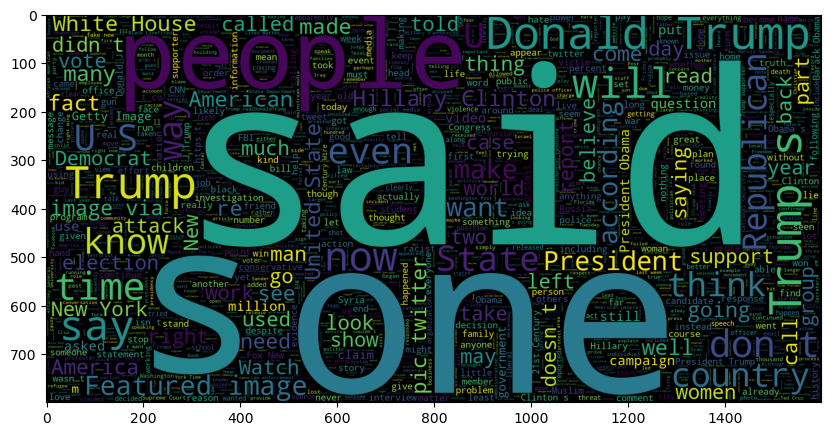

In [16]:

wc = WordCloud(max_words=2000, width=1600, height=800).generate(" ".join(df[df.label==0].text))
plt.figure(figsize=(10, 10))
plt.imshow(wc)
plt.show()

Fake haberlerde en çok kullanılan kelime bulutundan oluşturulmuş görsel

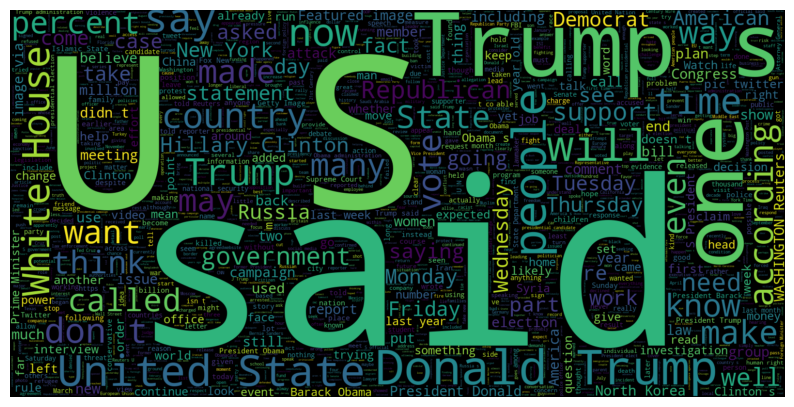

In [17]:
wc = WordCloud(max_words=2000, width=1600, height=800).generate(" ".join(df['text']))

plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation='bilinear')  
plt.axis("off") 
plt.show()

Tüm haberlerde en çok kullanılan kelime bulutundan oluşturulmuş görsel

## Modelling

In [18]:
X = df.clean_text
y = df.label

In [19]:
len(X),len(y)

(44888, 44888)

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [21]:
tokenizer = Tokenizer()

tokenizer.fit_on_texts(X_train)

train_token = tokenizer.texts_to_sequences(X_train)
test_token = tokenizer.texts_to_sequences(X_test)

Burada yapılan Tokenizer işlemi ile Eğitim ve test verilerindeki metinlerin kelimeleri sayılara dönüştürülür ve her bir kelime indexi ile birlikte saklanır.

In [22]:
total_tokens = len(tokenizer.word_index)
print("Total tokens:", total_tokens)

Total tokens: 211855


In [23]:
max_sequence_length = 0

for sequence in train_token:
    sequence_length = len(sequence)
    if sequence_length > max_sequence_length:
        max_sequence_length = sequence_length

print("Maximum sequence length:", max_sequence_length)

Maximum sequence length: 4961


Eğitim ve test verilerindeki en uzun dizi uzunluğunu bularak bunu ekrana yazdırır. En uzun dizi uzunluğuna gelindiğinde bir sonraki metne geçerek tüm veri seti boyunca bu işlemi yapar ve her metinin uzunluğunu depolar

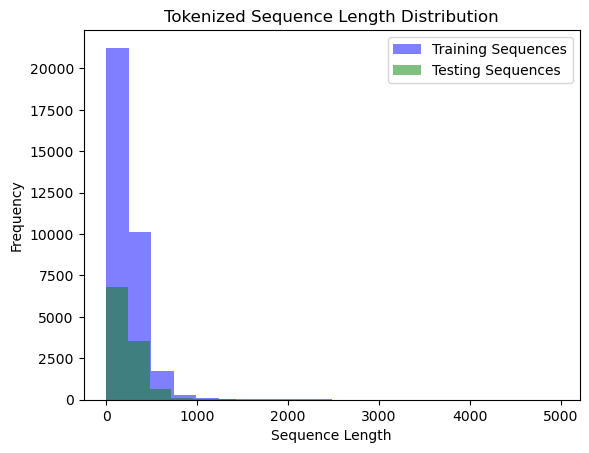

In [24]:
train_sequence_lengths = [len(seq) for seq in train_token]
test_sequence_lengths = [len(seq) for seq in test_token]

plt.hist(train_sequence_lengths, bins=20, label='Training Sequences', alpha=0.5, color='blue')

plt.hist(test_sequence_lengths, bins=20, label='Testing Sequences', alpha=0.5, color='green')

plt.xlabel('Sequence Length')
plt.ylabel('Frequency')
plt.legend()

plt.title('Tokenized Sequence Length Distribution')
plt.show()

In [25]:

maxlen = 20

train_sequences = pad_sequences(train_token, maxlen=maxlen, padding='post')
test_sequences = pad_sequences(test_token, maxlen=maxlen, padding='post')

Burada tokenize edilmiş verilerin tamamını belirli bir dizi sabit tutulacak şekilde kısaltır veya doldurur. Belirlenen maxlen parametresi uzunluğunda dizi boylarını ayarlar. Padding parametresi ile de doldurma ya da kısaltma işlemi metinlerin sonundan başlar. Bu işlem modelin eğitimi sırasında modelin iş yükünü azaltabilir ve daha standardize bir model kurulmuş olur. Bu durum daha tutarlı ve etkili sonuçlar yaratabilir.

In [27]:
model = Sequential([
    Embedding(input_dim=total_tokens+1, output_dim=4, input_length=20),
    SimpleRNN(32, return_sequences=True),
    SimpleRNN(32, return_sequences=True),
    SimpleRNN(32),
    Dense(1, activation="sigmoid")
])

model.compile(loss="binary_crossentropy", optimizer="adam", metrics=[tf.keras.metrics.AUC()])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 20, 4)             847424    
                                                                 
 simple_rnn (SimpleRNN)      (None, 20, 32)            1184      
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 20, 32)            2080      
                                                                 
 simple_rnn_2 (SimpleRNN)    (None, 32)                2080      
                                                                 
 dense (Dense)               (None, 1)                 33        
                                                                 
Total params: 852801 (3.25 MB)
Trainable params: 852801 (3.25 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Sequential modeli, katmanları sıralı bir şekilde eklemenizi sağlayan bir yapıdır. Buradaki katmanlarımız da şu şekildedir;

Embedding: Kelimelerin sayısal temsilini oluşturmak için kullanılan bir  katmanıdır. Bu katman, kelimeleri sabit boyutta sayısal vektörlere dönüştürür. input_dim parametresi, kelime dağarcığındaki toplam benzersiz kelime sayısına bir ekstra kelime (0) ekleyerek ayarlanmıştır. Bu, kelime indekslerini 1'den başlatmak için gereklidir. output_dim parametresi, her kelimenin gömme vektörünün boyutunu belirtir ve 4 olarak ayarlanmıştır. input_length parametresi, giriş metin dizilerinin maksimum uzunluğunu (20 kelime) belirtir. 

Üç adet SimpleRNN katmanı: Bu, basit tekrarlayan sinir ağı (RNN) katmanlarıdır. Her biri 32 gizli birim içerir ve return_sequences=True ile belirtilmiştir. Bu, her katmanın zaman adımı çıkışlarını döndüreceği anlamına gelir.

Dense katmanı: Son katman, bir yoğun (dense) katmandır ve bir tane çıkış birimi içerir. Bu birim, ikili sınıflandırma probleminde (örneğin, duyum analizi) sonucu tahmin etmek için kullanılır. activation="sigmoid" ile belirtilmiştir, çünkü bu, ikili sınıflandırma için yaygın olarak kullanılan sigmoid aktivasyon fonksiyonunu temsil eder.

model.compile(...): Modelin derlemesini yapar. Derleme işlemi, modelin eğitim sırasında nasıl öğrenme hızı ile nasıl kayıp hesaplanacağını belirler. İşte bu kodun parametreleri:

* loss="binary_crossentropy": Kayıp (loss) fonksiyonu olarak ikili sınıflandırma problemleri için kullanılan logaritmik kayıp fonksiyonu olan "binary_crossentropy" seçilmiştir.

* optimizer="adam": Optimizasyon algoritması olarak "adam" seçilmiştir. Adam, genellikle derin öğrenme modelleri için etkili bir optimizasyon algoritmasıdır.

* metrics=[tf.keras.metrics.AUC()]: Modelin metriklerini belirtir. Bu model, eğitim sırasında AUC (Alan Altındaki Eğri) metriği ile izlenecektir. AUC, sınıflandırma performansını değerlendirmek için yaygın olarak kullanılan bir metriktir.

In [28]:
y_train=y_train.astype(int)
y_test=y_test.astype(int)

In [29]:
history = model.fit(train_sequences, y_train, epochs=20, validation_data=(test_sequences, y_test))

Epoch 1/20
1053/1053 [==============================] - 28s 24ms/step - loss: 0.2036 - auc: 0.9736 - val_loss: 0.0964 - val_auc: 0.9942
Epoch 2/20
1053/1053 [==============================] - 23s 22ms/step - loss: 0.0416 - auc: 0.9983 - val_loss: 0.0889 - val_auc: 0.9943
Epoch 3/20
1053/1053 [==============================] - 20s 19ms/step - loss: 0.0104 - auc: 0.9997 - val_loss: 0.1170 - val_auc: 0.9904
Epoch 4/20
1053/1053 [==============================] - 20s 19ms/step - loss: 0.0046 - auc: 0.9999 - val_loss: 0.2344 - val_auc: 0.9750
Epoch 5/20
1053/1053 [==============================] - 21s 20ms/step - loss: 0.0048 - auc: 0.9999 - val_loss: 0.1463 - val_auc: 0.9858
Epoch 6/20
1053/1053 [==============================] - 21s 20ms/step - loss: 0.0061 - auc: 0.9999 - val_loss: 0.1737 - val_auc: 0.9826
Epoch 7/20
1053/1053 [==============================] - 23s 22ms/step - loss: 0.0027 - auc: 0.9999 - val_loss: 0.1596 - val_auc: 0.9840
Epoch 8/20
1053/1053 [==========================

In [30]:
train_preds = model.predict(train_sequences)
test_preds = model.predict(test_sequences)

print("Train Log Loss:", log_loss(y_train, train_preds))

print("Test Log Loss:", log_loss(y_test, test_preds))

print("Train ROC-AUC Score:", roc_auc_score(y_train, train_preds))
print("Test ROC-AUC Score:", roc_auc_score(y_test, test_preds))

print("Train Confusion Matrix:")
print(confusion_matrix(y_train, (train_preds > 0.5).astype(int)))

print("Test Confusion Matrix:")
print(confusion_matrix(y_test, (test_preds > 0.5).astype(int)))

351/351 [==============================] - 1s 4ms/step
Train Log Loss: 0.00033615534812572766
Test Log Loss: 0.30097078674028493
Train ROC-AUC Score: 0.9999927093268783
Test ROC-AUC Score: 0.993634941378577
Train Confusion Matrix:
[[17602     0]
 [    1 16063]]
Test Confusion Matrix:
[[5669  200]
 [ 202 5151]]


## Metric Graphs

#### ROC_AUC

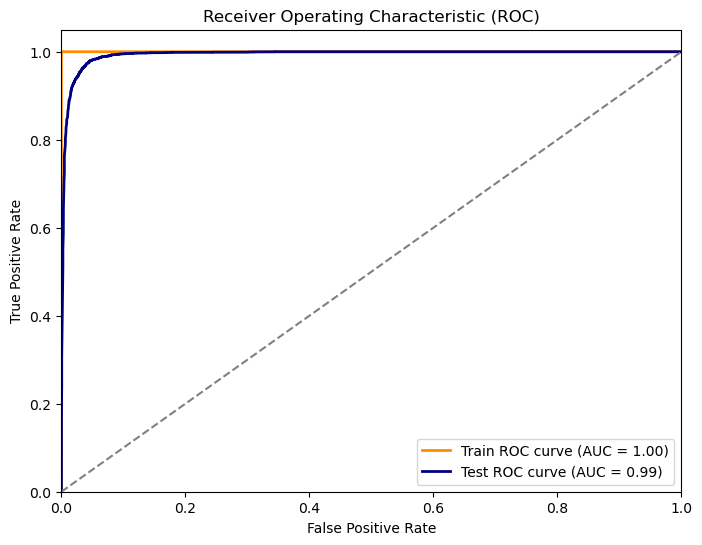

In [32]:
fpr_train, tpr_train, _ = roc_curve(y_train, train_preds)
fpr_test, tpr_test, _ = roc_curve(y_test, test_preds)

roc_auc_train = auc(fpr_train, tpr_train)
roc_auc_test = auc(fpr_test, tpr_test)

plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='darkorange', lw=2, label='Train ROC curve (AUC = {:.2f})'.format(roc_auc_train))
plt.plot(fpr_test, tpr_test, color='navy', lw=2, label='Test ROC curve (AUC = {:.2f})'.format(roc_auc_test))
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()


#### Confusion

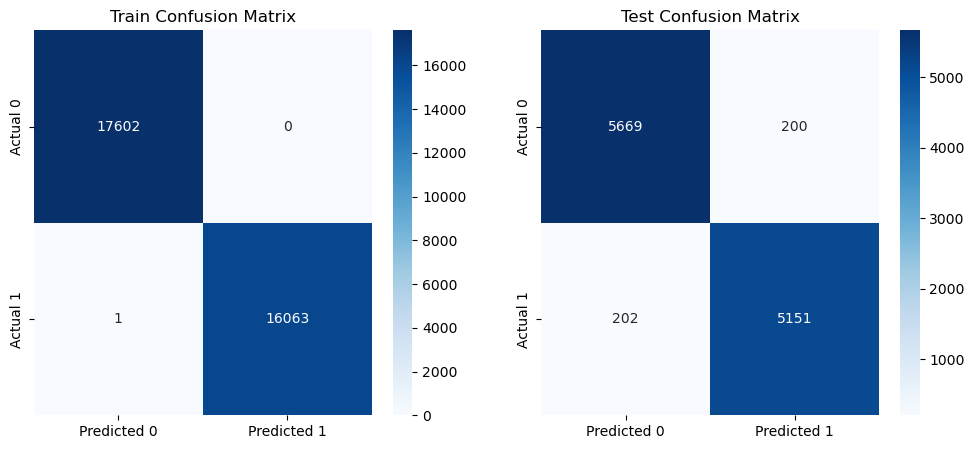

In [33]:
import seaborn as sns

train_cm = confusion_matrix(y_train, (train_preds > 0.5).astype(int))
test_cm = confusion_matrix(y_test, (test_preds > 0.5).astype(int))

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(train_cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.title('Train Confusion Matrix')

plt.subplot(1, 2, 2)
sns.heatmap(test_cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.title('Test Confusion Matrix')

plt.show()


Train ve Test Log Loss:

Eğitim Log Loss değeri oldukça düşüktür (0.0003). Bu, modelin eğitim verilerine uyum sağladığını ve kaybın düşük olduğunu gösterir, yani eğitim verileri üzerinde çok iyi performans gösteriyor.

Test Log Loss değeri biraz daha yüksektir (0.256), ancak hala kabul edilebilir düzeydedir. Bu, modelin test verileri üzerinde de iyi performans gösterdiğini ve aşırı uyumdan kaçındığını gösterir.

Train ve Test ROC-AUC Score:

Eğitim ROC-AUC skoru çok yüksektir (0.9999), neredeyse mükemmel bir performansı gösterir. Modelin eğitim verileri üzerinde sahte ve gerçek haberleri ayrımını yapma yeteneği çok yüksektir.

Test ROC-AUC skoru da oldukça yüksektir (0.9933). Bu, modelin test verileri üzerinde de güçlü bir performans sergilediğini gösterir. Ancak, eğitim ROC-AUC'si ile kıyaslandığında bir miktar daha düşüktür, bu da modelin belirli bir ölçüde genelleme yeteneğine sahip olduğunu gösterir.
Train ve Test Confusion Matrix:

Confusion matrisleri, modelin sınıflandırma performansını daha ayrıntılı bir şekilde gösterir.
Eğitim seti Confusion matrisine bakıldığında, sahte ve gerçek haberleri neredeyse hatasız bir şekilde ayırdığını görüyoruz. Sadece birkaç yanlış sınıflandırma yapılmış.
Test seti Confusion matrisine bakıldığında, modelin sahte ve gerçek haberleri iyi bir şekilde ayırdığını görüyoruz, ancak bazı yanlış sınıflandırmalar da bulunuyor. Yanlış pozitif (FP) ve yanlış negatif (FN) değerler mevcut, ancak genel olarak dengeli bir performans sergiliyor.

Sonuç olarak, bu sonuçlar sahte ve gerçek haberlerin sınıflandırılması için geliştirilen NLP modelinin oldukça başarılı olduğunu göstermektedir. 